## Kora Geek: A Football (Soccer) Tracker and Analyst

**Kora Geek** is an innovative football (soccer) tracking system designed to enhance match analysis by leveraging computer vision and machine learning techniques. Built for real-time detection and tracking, this project focuses on analyzing players, the ball, and referees, offering an in-depth view of the game that can be further developed into a powerful analysis tool for coaches, analysts, and enthusiasts.

### Key Features:
- **Player, Ball, and Referee Detection and Tracking:** 
  Kora Geek provides real-time detection and tracking of players, the ball, and referees, capturing every crucial element of the game.
  
- **Team Division with Embedding Analysis:** 
  The system intelligently divides players into their respective teams using embedding analysis for enhanced strategic insights.

- **Keypoint Detection & Homography:** 
  By detecting keypoints, the system provides accurate player positioning and integrates homography to map the playing field in real-world coordinates.

- **Video-Game Style Radar View:** 
  Visualize the game from a bird’s-eye view, similar to a video game radar, offering a comprehensive look at team formations and player movement.

- **Advanced Statistics and Insights:**
  - **Ball Trajectory Analysis:** Track and analyze the path of the ball throughout the match.
  - **Voronoi Diagrams:** Visualize team control and dominance across different areas of the pitch using Voronoi diagrams.

Kora Geek is built for football enthusiasts, analysts, and developers interested in pushing the boundaries of match analysis through data and visualization. As the project evolves, the potential applications range from real-time tactical analysis to game simulation and player performance reviews.


Index

Workflow

Source video

Object Dtection -> tracking -> team assigenment -> 

Keypoint Detection -> lines projection 

ball tracking
players projection 


## Section 0:   Dependancies and constants


In [1]:
import torch
import os
from ultralytics import YOLO
from transformers import AutoProcessor, SiglipVisionModel
import wandb
from roboflow import Roboflow
from dotenv import load_dotenv, dotenv_values 
from IPython.display import Image
import shutil
import supervision as sv
from tqdm import tqdm
from more_itertools import chunked
import numpy as np
import umap
from sklearn.cluster import KMeans
from sports.common.team import TeamClassifier
from inference import get_model

SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


In [2]:
load_dotenv() 
ROBOFLOW_API_KEY = os.getenv("ROBOFLOW_API_KEY")
WANDB_API_KEY = os.getenv("WANDB_API_KEY")
HOME = os.getenv("HOME")


wandb.login(key=WANDB_API_KEY)
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: mohamed2231 (mohamed2231-helwan-university). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: C:\Users\Mohamed\_netrc


In [3]:
!nvidia-smi

Tue Oct  8 13:15:49 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.76                 Driver Version: 560.76         CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |


|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1650      WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   57C    P8              1W /   50W |     320MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+------------------------+----------------------+
                                                                                         
+-----------------------------------------------------------------------------------------+
| Processes:                                                                              |
|  GPU   GI   CI        PID   Type   Process name                              GPU Memory |
|        ID   ID                                                               Us

## Section 1: Datasets and preprocessing

### Datasets
The original data used in Kora Geek comes from the **DFL - Bundesliga Data Shootout** Kaggle competition. This data has been further processed to create new datasets, which are hosted and available for download from the **Roboflow Universe**. These datasets enable various use cases within the project, including player detection, ball tracking, and pitch keypoint identification.

| **Use Case**                | **Dataset**                                   |
|-----------------------------|-----------------------------------------------|
| Soccer player detection      | [Download Dataset](#)                         |
| Soccer ball detection        | [Download Dataset](#)                         |
| Soccer pitch keypoint detection | [Download Dataset](#)                      |


The **Roboflow Soccer Player Detection** dataset is a specialized dataset designed to detect and track soccer players during a match. It is built from a collection of 1280x1280 images that have been labeled to identify individual players on the field, with bounding boxes marking their locations. This dataset is ideal for use in computer vision tasks like player tracking, team formation analysis, and movement prediction.

#### Key Features:
- **Annotated Player Data:** Each image in the dataset contains labeled bounding boxes around the players, making it easy for models to learn how to detect them in real-time.
- **Diverse Perspectives:** The dataset includes images captured from different angles and distances, providing a robust foundation for detecting players in various conditions, such as broadcast views, sideline angles, and overhead shots.
- **High-Quality Annotations:** Precise and detailed annotations ensure that the detection of players is accurate, facilitating further analysis such as player movement tracking and team division.

#### Use Cases:
- **Real-Time Player Tracking:** Use this dataset to train models that can detect and track players throughout the match.
- **Tactical Analysis:** Analyze player positioning, formations, and movement patterns using the detected player locations.
- **Performance Insights:** Combine player detection with advanced metrics like speed, distance covered, and heatmaps to gain insights into individual and team performances.

#### Classes:
- *Ball*
- *Goalkeeper*
- *Player*
- *Referee*


This dataset is part of the broader **Kora Geek** project and can be used to power soccer analysis tools, providing a solid foundation for detecting players in any football match context.

In [ ]:
# Download Dataset for player dectection

if not os.path.exists('datasets'):
    os.makedirs('datasets')

%cd datasets/

project = rf.workspace("roboflow-jvuqo").project("football-players-detection-3zvbc")
version = project.version(12)
dataset = version.download("yolov8")

In [ ]:
!gdown -O "./input_videos/0bfacc_0.mp4" "https://drive.google.com/uc?id=12TqauVZ9tLAv8kWxTTBFWtgt2hNQ4_ZF"
!gdown -O "./input_videos/2e57b9_0.mp4" "https://drive.google.com/uc?id=19PGw55V8aA6GZu5-Aac5_9mCy3fNxmEf"
!gdown -O "./input_videos/08fd33_0.mp4" "https://drive.google.com/uc?id=1OG8K6wqUw9t7lp9ms1M48DxRhwTYciK-"
!gdown -O "./input_videos/573e61_0.mp4" "https://drive.google.com/uc?id=1yYPKuXbHsCxqjA9G-S6aeR2Kcnos8RPU"
!gdown -O "./input_videos/121364_0.mp4" "https://drive.google.com/uc?id=1vVwjW1dE1drIdd4ZSILfbCGPD4weoNiu"

#### Football Pitch Detection

For the accurate detection of football pitch boundaries and key areas, we are utilizing a specialized dataset available on [Roboflow Universe](https://universe.roboflow.com/roboflow-jvuqo/football-field-detection-f07vi). This dataset is designed specifically for detecting football fields, providing essential data to help models recognize and understand the layout of the playing surface from various angles and conditions.

#### Dataset Overview:
- **Football Pitch Detection:**
  The dataset contains annotated images where football fields are labeled with key boundary features, such as the touchlines, goal lines, and center circles. These annotations are crucial for training models to accurately detect and map the structure of the pitch.

#### Key Features:
1. **Diverse Pitch Layouts:**  
   The dataset includes images from a wide variety of football fields, taken from different camera angles, lighting conditions, and stadium environments. This diversity helps improve model robustness and generalization when detecting pitches in different scenarios.

2. **Accurate Annotations:**  
   The football fields are precisely labeled with polygons outlining the important boundaries, including goal areas and center lines. This level of accuracy ensures that the model can recognize the exact shape and layout of the pitch in different situations.

3. **Handling Variations:**  
   The dataset is designed to account for common variations in field appearance, such as weather conditions, shadows, and changes in lighting. This helps the model adapt to real-world challenges, ensuring reliable detection of the pitch under diverse conditions.

#### Use Cases:
- **Pitch Recognition:**  
  By training on this dataset, models can accurately detect and outline the football pitch in video or image feeds. This is essential for applying homography, a process that maps the detected pitch to real-world coordinates, enabling tasks like player tracking and positioning analysis.

- **Tactical and Game Analysis:**  
  With pitch detection, analysts can divide the field into zones, monitor team formations, and track ball movement relative to the playing field. This helps generate deeper insights into team control, tactics, and player positioning throughout a match.

The dataset can be accessed and used for various football pitch detection tasks. You can download and explore the dataset here:  
[Download Football Pitch Detection Dataset](https://universe.roboflow.com/roboflow-jvuqo/football-field-detection-f07vi).

In [ ]:
%cd datasets/
project = rf.workspace("roboflow-jvuqo").project("football-field-detection-f07vi")
version = project.version(15)
dataset = version.download("yolov8")

## Section 2: Player Dection & Tracking

In [ ]:
!yolo task=detect mode=train model=yolov8l.pt data={dataset.location}/data.yaml batch=6 epochs=100 imgsz=1280 plots=True

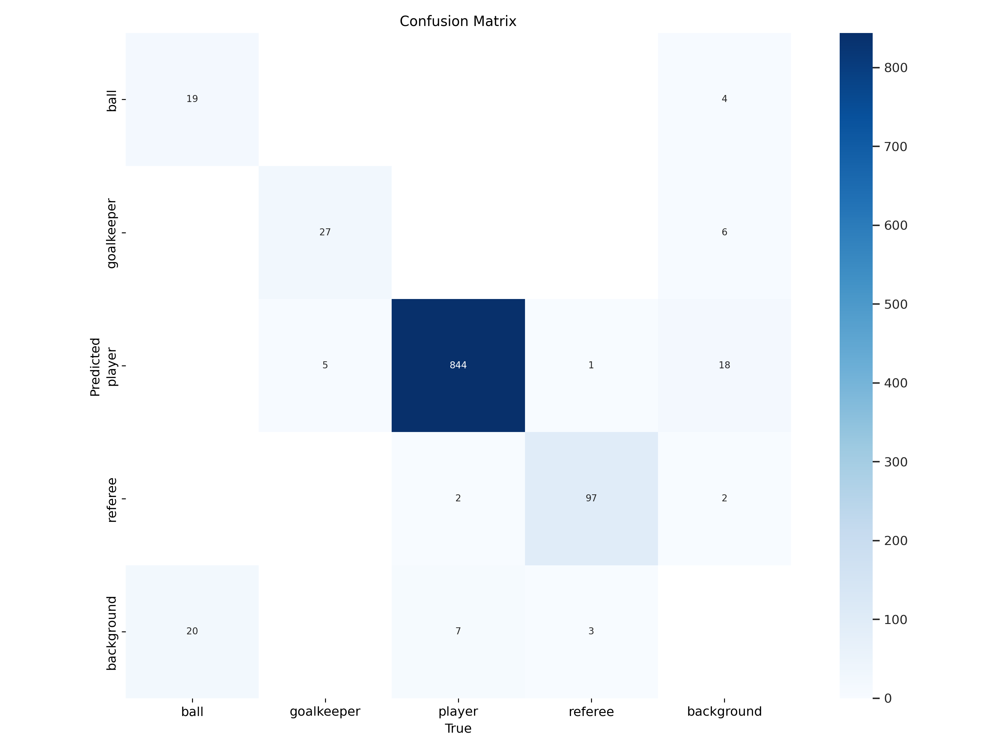

In [18]:
Image(filename=f'{HOME}/runs/detect/train_large/confusion_matrix.png', width=600)

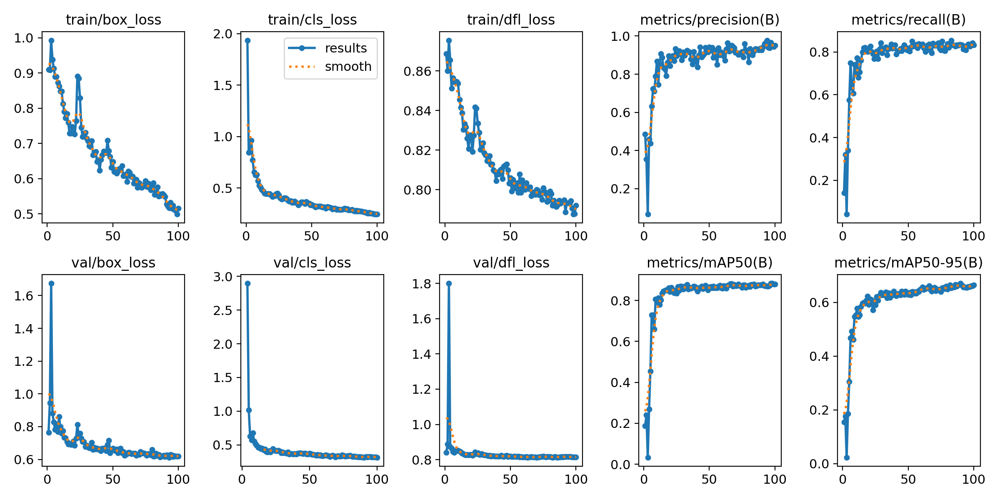

In [19]:
Image(filename=f'{HOME}/runs/detect/train_large/results.png', width=600)

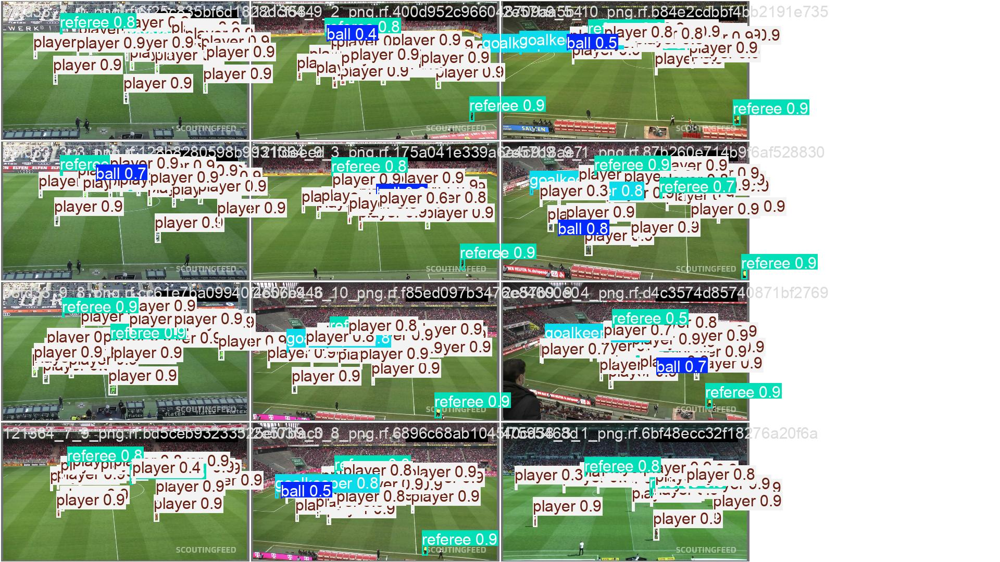

In [20]:
Image(filename=f'{HOME}/runs/detect/train_large/val_batch0_pred.jpg', width=600)

In [4]:
PLAYER_DETECTION_MODEL = YOLO('./runs/detect/train_large/weights/best.pt')

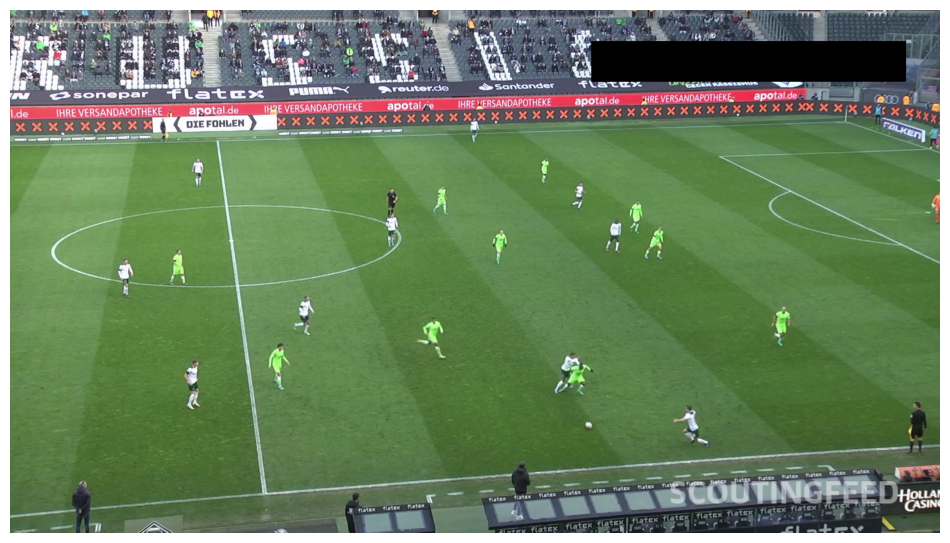

In [5]:
SOURCE_VID_PATH = './input_videos/08fd33_4.mp4'

frame_generator = sv.get_video_frames_generator(SOURCE_VID_PATH)
frame = next(frame_generator)

sv.plot_image(frame)


0: 736x1280 1 ball, 21 players, 3 referees, 161.0ms
Speed: 9.0ms preprocess, 161.0ms inference, 182.9ms postprocess per image at shape (1, 3, 736, 1280)


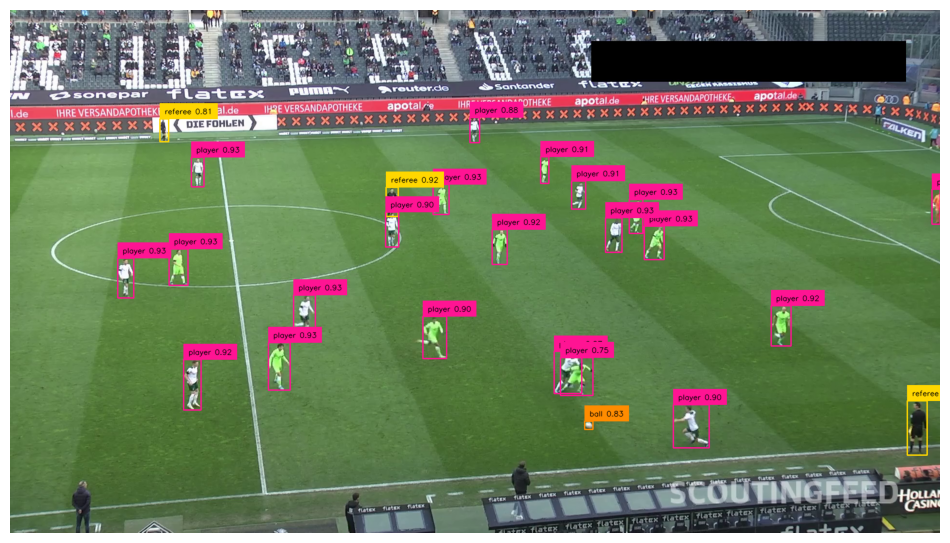

In [23]:
box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

frame_generator = sv.get_video_frames_generator(SOURCE_VID_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3)[0]
detections = sv.Detections.from_ultralytics(result)

labels = [
    f"{class_name} {confidence:.2f}" 
    for class_name, confidence in zip(detections['class_name'], detections.confidence)
]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels)

sv.plot_image(annotated_frame)

##### Video Game style visuals


0: 736x1280 1 ball, 21 players, 3 referees, 161.1ms
Speed: 7.0ms preprocess, 161.1ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


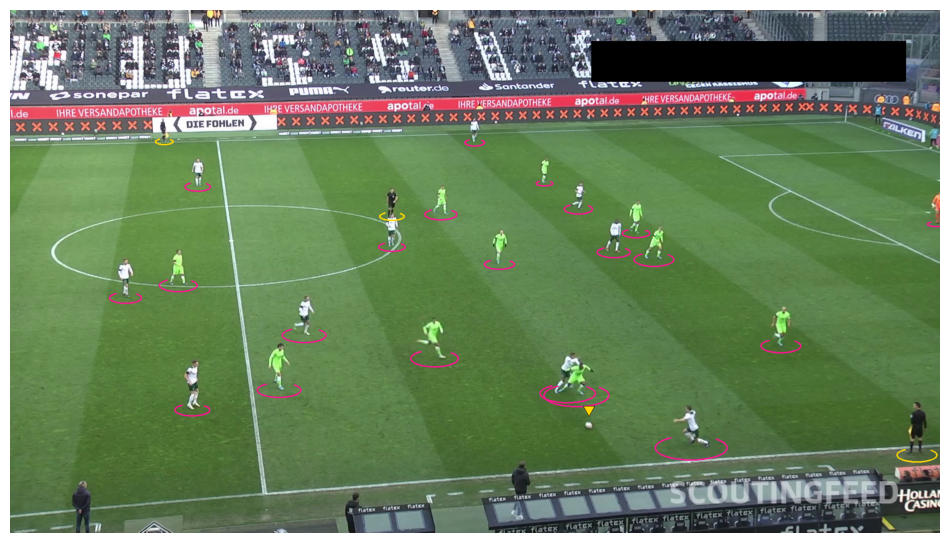

In [24]:
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

frame_generator = sv.get_video_frames_generator(SOURCE_VID_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3)[0]
detections = sv.Detections.from_ultralytics(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

#### Player Tracking


0: 736x1280 1 ball, 21 players, 3 referees, 387.9ms
Speed: 14.0ms preprocess, 387.9ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


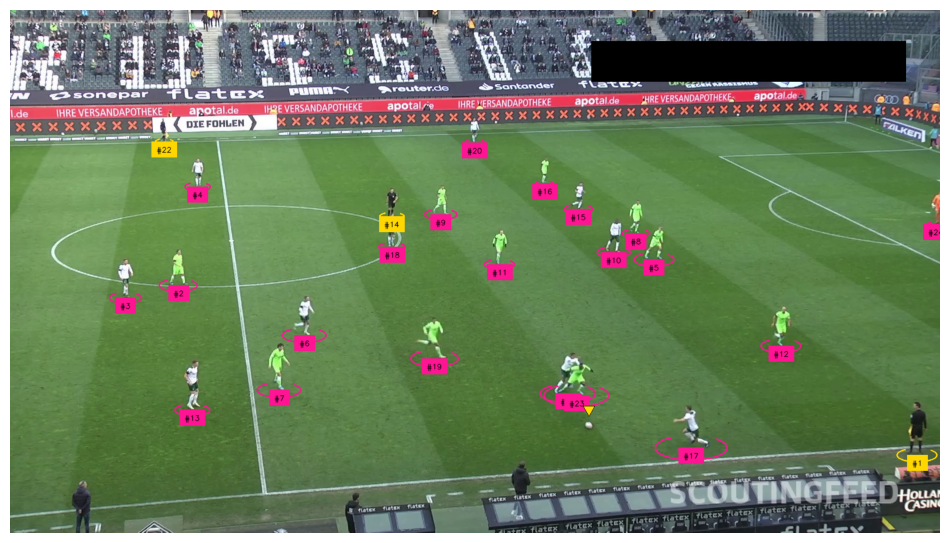

In [25]:
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VID_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3)[0]
detections = sv.Detections.from_ultralytics(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1
all_detections = tracker.update_with_detections(detections=all_detections)

labels = [
    f"#{tracker_id}" for tracker_id in all_detections.tracker_id
]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)

annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)

annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

In [ ]:
SOURCE_VID_PATH = './input_videos/08fd33_4.mp4'
TARGET_VID_PATH = './output_videos/08fd33_4_results_1.mp4'


box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color= sv.Color.from_hex('#000000')
)

video_info = sv.VideoInfo.from_video_path(SOURCE_VID_PATH)
video_sink = sv.VideoSink(TARGET_VID_PATH, video_info=video_info)

frame_genrator = sv.get_video_frames_generator(source_path=SOURCE_VID_PATH)

with video_sink:
    for frame in tqdm(frame_genrator, total=video_info.total_frames):

        results = PLAYER_DETECTION_MODEL.predict(frame,conf=0.3)[0]
        detections = sv.Detections.from_ultralytics(results)

        labels = [
            f'{class_name} {confidence:.2f}'
            for class_name, confidence in zip(detections['class_name'], detections.confidence)
        ]

        annotated_frame = frame.copy()
        annotated_frame = box_annotator.annotate(annotated_frame, detections)
        annotated_frame = label_annotator.annotate(annotated_frame, detections, labels=labels)
        video_sink.write_frame(annotated_frame)


In [ ]:
SOURCE_VID_PATH = './input_videos/08fd33_4.mp4'
TARGET_VID_PATH = './output_videos/08fd33_4_results_2.mp4'

BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20,
    height=17
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color= sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

tracker = sv.ByteTrack()
tracker.reset()

video_info = sv.VideoInfo.from_video_path(SOURCE_VID_PATH)
video_sink = sv.VideoSink(TARGET_VID_PATH, video_info=video_info)

frame_genrator = sv.get_video_frames_generator(source_path=SOURCE_VID_PATH)

with video_sink:
    for frame in tqdm(frame_genrator, total=video_info.total_frames):

        results = PLAYER_DETECTION_MODEL.predict(frame,conf=0.3)[0]
        detections = sv.Detections.from_ultralytics(results)
        
        ball_detections = detections[detections.class_id == BALL_ID]
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

        all_detections = detections[detections.class_id != BALL_ID]
        all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
        all_detections.class_id = all_detections.class_id - 1
        all_detections = tracker.update_with_detections(all_detections)
        
        labels = [
            f'#{tracker_id} '
            for tracker_id in all_detections.tracker_id
        ]

        annotated_frame = frame.copy()
        annotated_frame = ellipse_annotator.annotate(annotated_frame, all_detections)
        annotated_frame = triangle_annotator.annotate(annotated_frame, ball_detections)
        annotated_frame = label_annotator.annotate(annotated_frame, all_detections, labels=labels)
        
        video_sink.write_frame(annotated_frame)


## Section 3: Embedding Analysis 

Dividing teams based on color detection is often unreliable in real-world scenarios due to factors like lighting variations, shadows, camera angles, and overlapping colors between team jerseys and the environment (e.g., spectators or field elements). This can result in inaccurate team classification, especially when teams wear similar colors or lighting distorts the jersey hues. A better approach is to use **SigLip (Signature Learning in Projection)** combined with dimensionality reduction techniques like **UMAP (Uniform Manifold Approximation and Projection)** and clustering algorithms such as **K-Means**. SigLip learns distinctive player embeddings based on more complex features like player movement, body posture, and spatial positioning, rather than relying solely on color. UMAP helps in reducing the high-dimensional feature space into a more manageable form while preserving important relationships between players. K-Means then clusters players based on these embeddings, making team division far more robust and accurate. This approach overcomes the limitations of color detection and provides a more effective solution for team segmentation, even in complex and dynamic match environments.

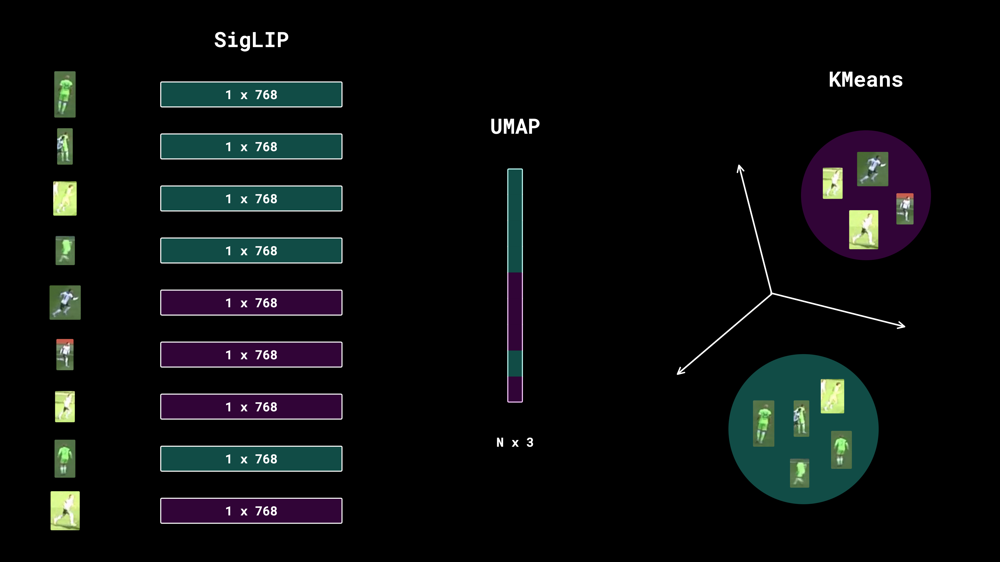


Note: Before training our player clustering model, we need to gather training data. To do this, we'll sample one frame per second, detect players within those frames, and then crop them out.

In [6]:
STRIDE = 30
PLAYER_ID = 2

def extract_crops(source_video_path: str):
    frame_genrator = sv.get_video_frames_generator(SOURCE_VID_PATH, stride=STRIDE)
    crops = []

    for frame in tqdm(frame_genrator, desc='collecting crops'):
        results = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3)[0]
        detections = sv.Detections.from_ultralytics(results)
        detections = detections.with_nms(threshold=0.5, class_agnostic=True)
        detections = detections[detections.class_id == PLAYER_ID]
        crops += [
            sv.crop_image(frame,xyxy)
            for xyxy in detections.xyxy
        ]
    return crops

Here's a sample (100 elements) of the crops we've gathered.

In [27]:
crops = extract_crops(SOURCE_VID_PATH)

collecting crops: 0it [00:00, ?it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 370.5ms
Speed: 57.2ms preprocess, 370.5ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 1it [00:00,  1.88it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 231.5ms
Speed: 7.5ms preprocess, 231.5ms inference, 1.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 2it [00:00,  2.47it/s]


0: 736x1280 1 ball, 20 players, 2 referees, 246.5ms
Speed: 9.0ms preprocess, 246.5ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 3it [00:01,  2.72it/s]


0: 736x1280 1 ball, 20 players, 1 referee, 246.0ms
Speed: 8.5ms preprocess, 246.0ms inference, 14.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 4it [00:01,  2.83it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 252.3ms
Speed: 13.0ms preprocess, 252.3ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 5it [00:02,  2.17it/s]


0: 736x1280 1 ball, 21 players, 2 referees, 251.0ms
Speed: 8.0ms preprocess, 251.0ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 6it [00:02,  2.40it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 250.1ms
Speed: 9.0ms preprocess, 250.1ms inference, 2.5ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 7it [00:02,  2.58it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 251.4ms
Speed: 9.0ms preprocess, 251.4ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 8it [00:03,  2.72it/s]


0: 736x1280 21 players, 3 referees, 256.1ms
Speed: 8.0ms preprocess, 256.1ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 9it [00:03,  2.81it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 257.0ms
Speed: 9.0ms preprocess, 257.0ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 10it [00:03,  2.59it/s]


0: 736x1280 21 players, 3 referees, 245.9ms
Speed: 10.0ms preprocess, 245.9ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 11it [00:04,  2.76it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 247.1ms
Speed: 10.0ms preprocess, 247.1ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 12it [00:04,  2.84it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 246.5ms
Speed: 11.0ms preprocess, 246.5ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 13it [00:04,  2.92it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 248.1ms
Speed: 16.5ms preprocess, 248.1ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 14it [00:05,  2.70it/s]


0: 736x1280 20 players, 3 referees, 249.6ms
Speed: 7.0ms preprocess, 249.6ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 15it [00:05,  2.80it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 246.6ms
Speed: 11.0ms preprocess, 246.6ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 16it [00:05,  2.88it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 246.7ms
Speed: 7.0ms preprocess, 246.7ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 17it [00:06,  2.94it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 3 referees, 247.3ms
Speed: 13.0ms preprocess, 247.3ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 18it [00:06,  2.74it/s]


0: 736x1280 1 goalkeeper, 20 players, 3 referees, 247.3ms
Speed: 9.0ms preprocess, 247.3ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 19it [00:07,  2.83it/s]


0: 736x1280 1 goalkeeper, 20 players, 3 referees, 246.2ms
Speed: 7.0ms preprocess, 246.2ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 20it [00:07,  2.89it/s]


0: 736x1280 1 goalkeeper, 20 players, 3 referees, 247.7ms
Speed: 7.0ms preprocess, 247.7ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 21it [00:07,  2.94it/s]


0: 736x1280 1 goalkeeper, 20 players, 3 referees, 247.0ms
Speed: 8.0ms preprocess, 247.0ms inference, 2.1ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 22it [00:08,  2.97it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 3 referees, 247.2ms
Speed: 8.0ms preprocess, 247.2ms inference, 1.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 23it [00:08,  2.97it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 3 referees, 247.4ms
Speed: 8.0ms preprocess, 247.4ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 24it [00:08,  3.00it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 3 referees, 246.8ms
Speed: 10.0ms preprocess, 246.8ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 25it [00:09,  2.75it/s]


In [28]:
len(crops)

507

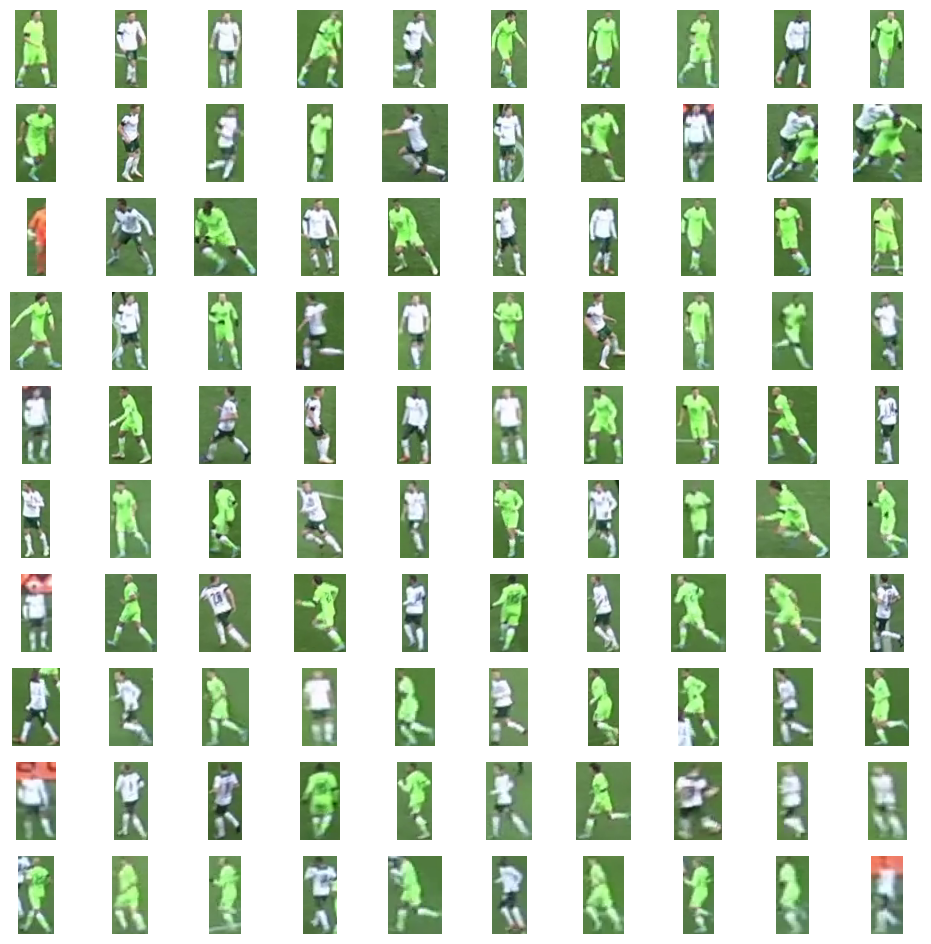

In [29]:
sv.plot_images_grid(crops[:100], grid_size=[10,10])

Next, we'll run SigLIP to calculate embeddings for each of the crops.

In [7]:
SIGLIP_MODEL_PATH = 'google/siglip-base-patch16-224'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

In [31]:
BATCH_SIZE = 32
crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = chunked(crops,BATCH_SIZE)
data = []

with torch.inference_mode():
    for batch in tqdm(batches,desc='embeddings extraction'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors='pt').to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state,dim=1).cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)

embeddings extraction: 0it [00:00, ?it/s]UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
embeddings extraction: 16it [00:24,  1.54s/it]


In [32]:
data.shape

(507, 768)

Using UMAP, we project our embeddings from (N, 768) to (N, 3) and then perform a two-cluster division using KMeans.

In [8]:
REDUCER = umap.UMAP(n_components=3)
CLUSTERING_MODEL = KMeans(n_clusters=2)

In [7]:
projections = REDUCER.fit_transform(data)

NameError: name 'data' is not defined

In [35]:
projections.shape

(507, 3)

In [36]:
clusters = CLUSTERING_MODEL.fit_predict(projections)

Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md



In [37]:
clusters[:10]

array([0, 1, 1, 0, 1, 0, 0, 0, 1, 0])

In [38]:
team_0 = [
    crop for crop, cluster in zip(crops,clusters) if cluster==0
]

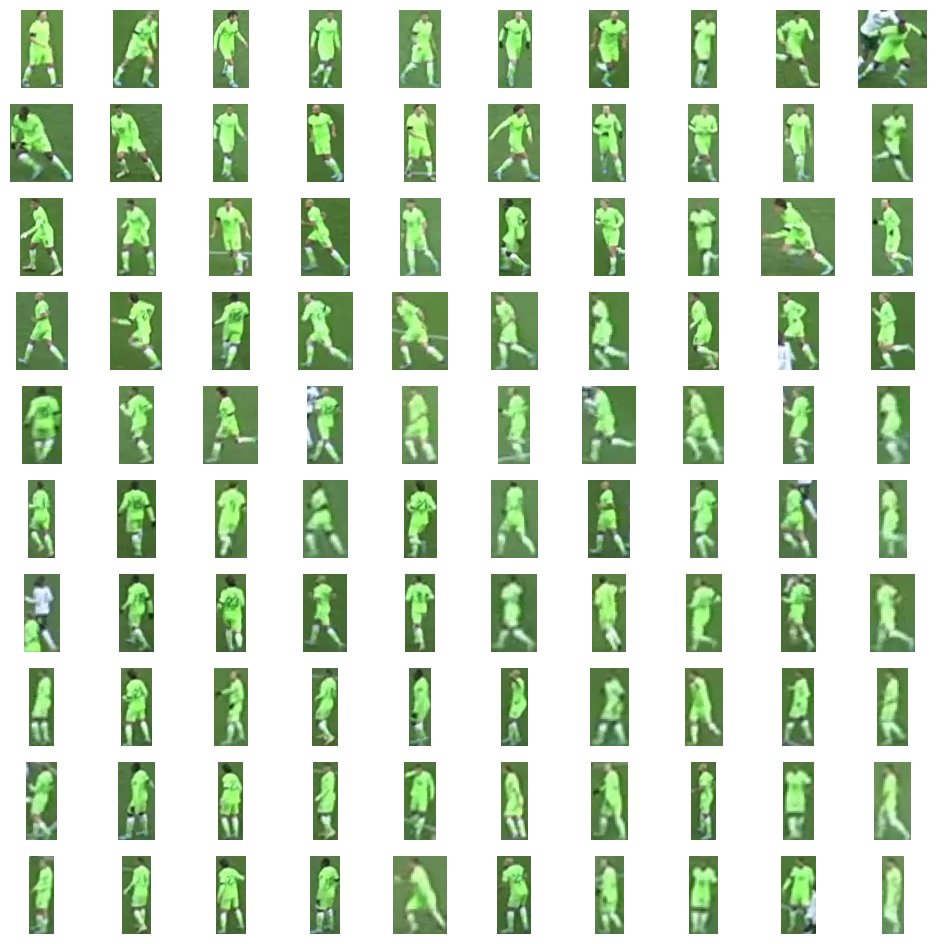

In [39]:
sv.plot_images_grid(team_0[:100], grid_size=(10,10))

In [24]:
import plotly.graph_objects as go
import numpy as np
from typing import Dict, List
from IPython.core.display import display, HTML
from PIL import Image
import base64
from io import BytesIO


def pil_image_to_data_uri(image: Image.Image) -> str:
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    images: List[Image.Image],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    image_data_uris = {f"image_{i}": pil_image_to_data_uri(image) for i, image in enumerate(images)}
    image_ids = np.array([f"image_{i}" for i in range(len(images))])

    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_ids[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>image ID: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    javascript_code = f"""
    <script>
        function displayImage(imageId) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imageId];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        var chartElement = document.getElementById('scatter-plot-3d');

        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """

    display(HTML(html_template))

display_projections(clusters, projections, crops)

To simplify the use of the SigLIP, UMAP, and KMeans combo, we use the Roboflow package that you can find in the sports repository.

In [40]:
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VID_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3)[0]
    detections = sv.Detections.from_ultralytics(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

team_classifier = TeamClassifier(device=DEVICE)
team_classifier.fit(crops)

collecting crops: 0it [00:00, ?it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 284.1ms
Speed: 82.2ms preprocess, 284.1ms inference, 3.5ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 1it [00:00,  2.16it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 139.8ms
Speed: 8.0ms preprocess, 139.8ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 2it [00:00,  3.14it/s]


0: 736x1280 1 ball, 20 players, 2 referees, 172.7ms
Speed: 8.0ms preprocess, 172.7ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 3it [00:00,  3.46it/s]


0: 736x1280 1 ball, 20 players, 1 referee, 252.3ms
Speed: 9.0ms preprocess, 252.3ms inference, 4.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 4it [00:01,  3.27it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 257.6ms
Speed: 11.5ms preprocess, 257.6ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 5it [00:01,  3.12it/s]


0: 736x1280 1 ball, 21 players, 2 referees, 253.8ms
Speed: 9.0ms preprocess, 253.8ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 6it [00:01,  3.07it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 255.7ms
Speed: 9.0ms preprocess, 255.7ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 7it [00:02,  3.09it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 255.7ms
Speed: 9.0ms preprocess, 255.7ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 8it [00:02,  3.09it/s]


0: 736x1280 21 players, 3 referees, 247.1ms
Speed: 8.5ms preprocess, 247.1ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 9it [00:02,  3.06it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 252.6ms
Speed: 10.0ms preprocess, 252.6ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 10it [00:03,  3.05it/s]


0: 736x1280 21 players, 3 referees, 254.7ms
Speed: 11.0ms preprocess, 254.7ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 11it [00:03,  3.06it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 253.1ms
Speed: 10.0ms preprocess, 253.1ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 12it [00:03,  3.03it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 249.3ms
Speed: 10.0ms preprocess, 249.3ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 13it [00:04,  3.05it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 251.7ms
Speed: 9.0ms preprocess, 251.7ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 14it [00:04,  3.04it/s]


0: 736x1280 20 players, 3 referees, 246.3ms
Speed: 8.5ms preprocess, 246.3ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 15it [00:04,  3.03it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 247.3ms
Speed: 10.1ms preprocess, 247.3ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 16it [00:05,  3.06it/s]


0: 736x1280 1 ball, 20 players, 3 referees, 249.1ms
Speed: 9.0ms preprocess, 249.1ms inference, 1.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 17it [00:05,  3.06it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 3 referees, 246.0ms
Speed: 9.0ms preprocess, 246.0ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 18it [00:05,  3.04it/s]


0: 736x1280 1 goalkeeper, 20 players, 3 referees, 246.9ms
Speed: 9.0ms preprocess, 246.9ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 19it [00:06,  3.07it/s]


0: 736x1280 1 goalkeeper, 20 players, 3 referees, 247.0ms
Speed: 7.6ms preprocess, 247.0ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 20it [00:06,  3.06it/s]


0: 736x1280 1 goalkeeper, 20 players, 3 referees, 247.8ms
Speed: 9.0ms preprocess, 247.8ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 21it [00:06,  3.04it/s]


0: 736x1280 1 goalkeeper, 20 players, 3 referees, 247.7ms
Speed: 7.0ms preprocess, 247.7ms inference, 4.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 22it [00:07,  3.05it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 3 referees, 247.1ms
Speed: 7.0ms preprocess, 247.1ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 23it [00:07,  3.03it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 3 referees, 247.6ms
Speed: 10.0ms preprocess, 247.6ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 24it [00:07,  3.03it/s]


0: 736x1280 1 ball, 1 goalkeeper, 20 players, 3 referees, 252.1ms
Speed: 11.0ms preprocess, 252.1ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 1280)


collecting crops: 25it [00:08,  3.03it/s]
Embedding extraction: 19it [00:29,  1.55s/it]


Time to assign goalkeepers to teams. We'll use a simple heuristic: calculate the average position (centroid) of the players belonging to both teams and then assign the goalkeeper to the team whose average position is closer.

In [9]:
def resolve_goalkeepers_team_id(players: sv.Detections,
                                goalkeepers: sv.Detections) -> np.ndarray:
    
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    
    team_0_centroid = players_xy[players.class_id == 0].mean(axis=0)
    team_1_centroid = players_xy[players.class_id == 1].mean(axis=0)
    
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
        
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)


0: 736x1280 1 ball, 21 players, 3 referees, 410.4ms
Speed: 10.0ms preprocess, 410.4ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)


Embedding extraction: 1it [00:01,  1.05s/it]


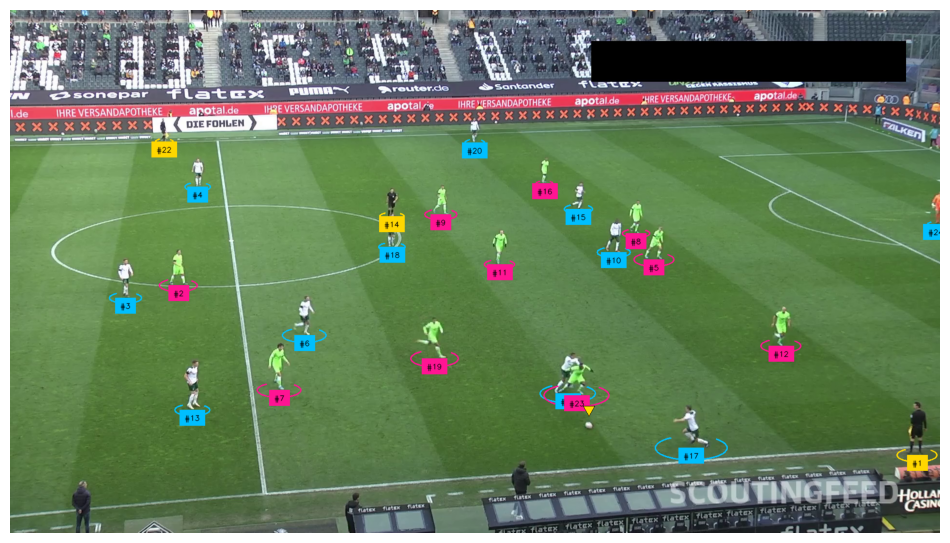

In [42]:
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VID_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3)[0]
detections = sv.Detections.from_ultralytics(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(players_detections,
                                                              goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

labels = [
    f"#{tracker_id}"
    for tracker_id in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame,
                                             detections=all_detections)

annotated_frame = label_annotator.annotate(scene=annotated_frame,
                                           detections=all_detections,
                                           labels=labels)

annotated_frame = triangle_annotator.annotate(scene=annotated_frame,
                                              detections=ball_detections)

sv.plot_image(annotated_frame)

In [43]:
SOURCE_VID_PATH = './input_videos/08fd33_4.mp4'
TARGET_VID_PATH = './output_videos/08fd33_4_results_3.mp4'

BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

video_info = sv.VideoInfo.from_video_path(SOURCE_VID_PATH)
video_sink = sv.VideoSink(TARGET_VID_PATH, video_info=video_info)

frame_generator = sv.get_video_frames_generator(SOURCE_VID_PATH)

with video_sink:
    for frame in tqdm(frame_generator, total=video_info.total_frames):

        result = PLAYER_DETECTION_MODEL.predict(frame, conf=0.3)[0]
        detections = sv.Detections.from_ultralytics(result)

        ball_detections = detections[detections.class_id == BALL_ID]
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

        all_detections = detections[detections.class_id != BALL_ID]
        all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
        all_detections = tracker.update_with_detections(detections=all_detections)

        goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
        players_detections = all_detections[all_detections.class_id == PLAYER_ID]
        referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

        players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
        players_detections.class_id = team_classifier.predict(players_crops)

        goalkeepers_detections.class_id = resolve_goalkeepers_team_id(players_detections,
                                                                    goalkeepers_detections)

        referees_detections.class_id -= 1

        all_detections = sv.Detections.merge([
            players_detections, goalkeepers_detections, referees_detections])

        labels = [
            f"#{tracker_id}"
            for tracker_id in all_detections.tracker_id
        ]

        all_detections.class_id = all_detections.class_id.astype(int)

        annotated_frame = frame.copy()
        annotated_frame = ellipse_annotator.annotate(scene=annotated_frame,
                                                    detections=all_detections)

        annotated_frame = label_annotator.annotate(scene=annotated_frame,
                                                detections=all_detections,
                                                labels=labels)

        annotated_frame = triangle_annotator.annotate(scene=annotated_frame,
                                                    detections=ball_detections)
        
        video_sink.write_frame(annotated_frame)


  0%|                                                                                          | 0/750 [00:00<?, ?it/s]


0: 736x1280 1 ball, 21 players, 3 referees, 389.7ms
Speed: 60.5ms preprocess, 389.7ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)



Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:01,  1.03s/it]
  0%|                                                                                  | 1/750 [00:03<40:59,  3.28s/it]


0: 736x1280 1 ball, 21 players, 3 referees, 358.8ms
Speed: 10.0ms preprocess, 358.8ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)



Embedding extraction: 0it [00:01, ?it/s]
  0%|                                                                                  | 1/750 [00:04<58:48,  4.71s/it]


KeyboardInterrupt: 

## Section 4: Pitch Keypoint Detection

!yolo task=pose mode=train model=yolov8l-pose.pt data={dataset.location}/data.yaml batch=16 epochs=100 imgsz=640 mosaic=0.0 plots=True

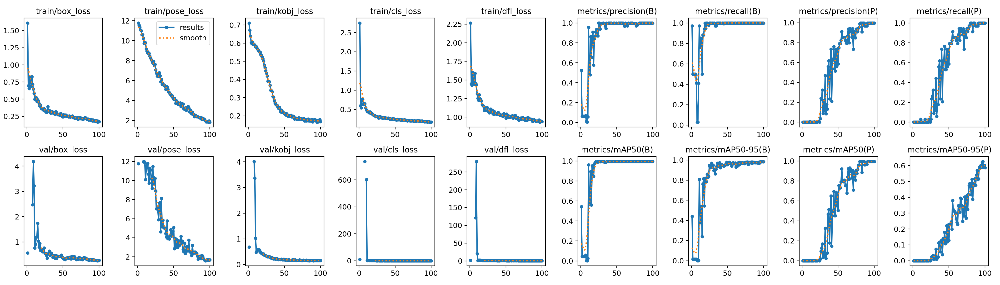

In [44]:
Image(filename=f'{HOME}/runs/pose/train/results.png', width=600)

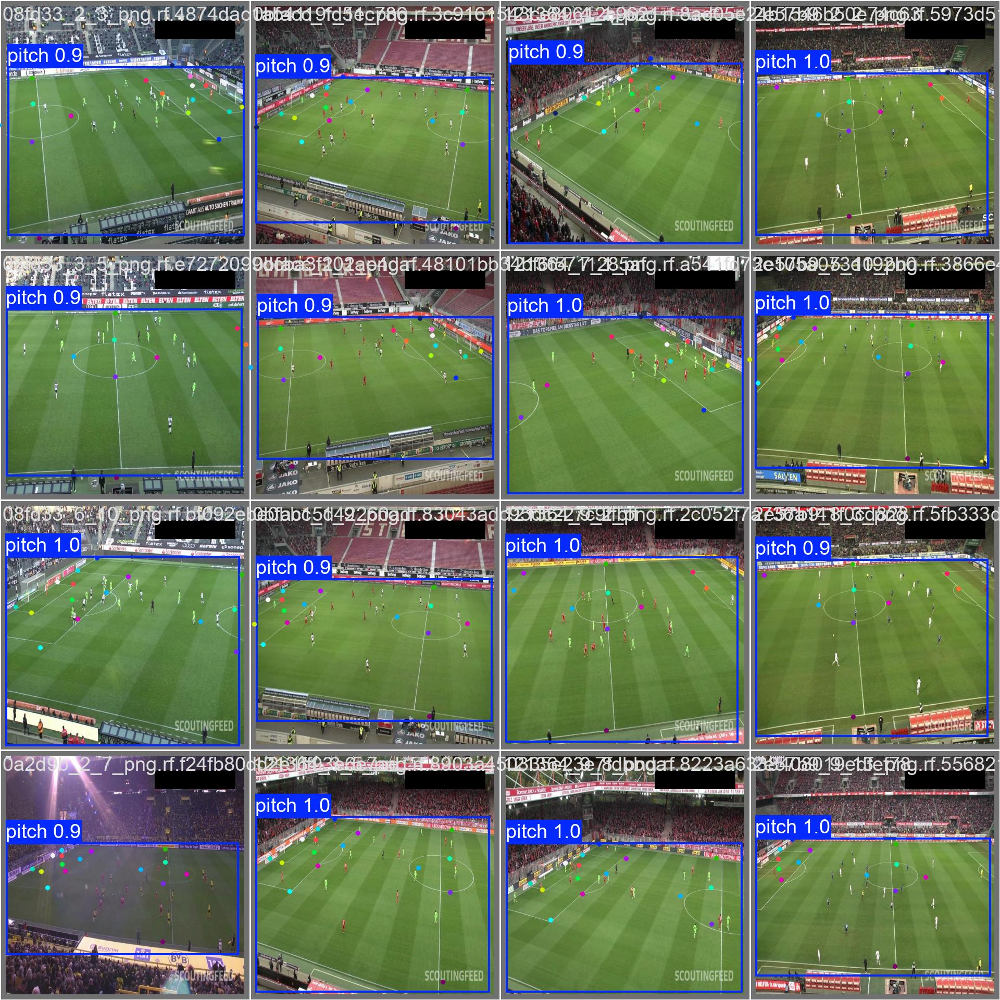

In [45]:
Image(filename=f'{HOME}/runs/pose/train/val_batch0_pred.jpg', width=600)

In [46]:
!yolo task=pose mode=val model={HOME}/runs/pose/train/weights/best.pt data={dataset.location}/data.yaml

^C


Traceback (most recent call last):
  File "C:\Python311\Lib\site-packages\urllib3\connection.py", line 174, in _new_conn
    conn = connection.create_connection(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python311\Lib\site-packages\urllib3\util\connection.py", line 72, in create_connection
    for res in socket.getaddrinfo(host, port, family, socket.SOCK_STREAM):
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Python311\Lib\socket.py", line 962, in getaddrinfo
    for res in _socket.getaddrinfo(host, port, family, type, proto, flags):
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
socket.gaierror: [Errno 11001] getaddrinfo failed

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Python311\Lib\site-packages\urllib3\connectionpool.py", line 716, in urlopen
    httplib_response = self._make_request(
                       ^^^^^^^^^^^^^^^^^^^
  File "

In [47]:
PITCH_DETECTION_MODEL = YOLO('./runs/pose/train/weights/best.pt')

In [4]:
PITCH_DETECTION_MODEL_ID = "football-field-detection-f07vi/15"
PITCH_DETECTION_MODEL = get_model(model_id=PITCH_DETECTION_MODEL_ID,
                                  api_key=ROBOFLOW_API_KEY)

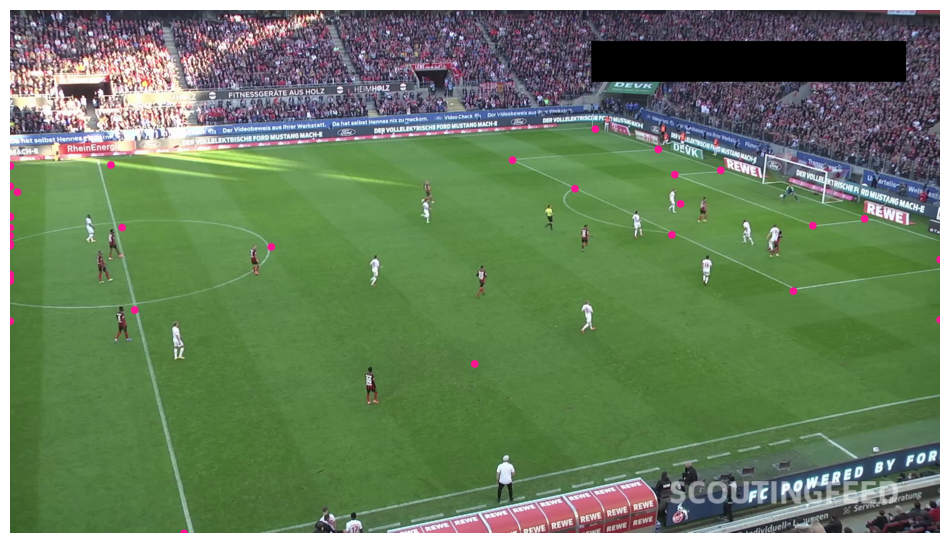

In [6]:
SOURCE_VID_PATH = './input_videos/573e61_0.mp4'
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8
)

frame_generator = sv.get_video_frames_generator(SOURCE_VID_PATH)
frame = next(frame_generator)

results = PITCH_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(results)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=key_points)

sv.plot_image(annotated_frame)